In this notebook, I have reviewed if there is any bias in the given data set for pneumonia, by checking using matplotlib the class sizes for both the classes. After doing so, there was a clear difference between the number of images available for the NORMAL class and less for the pneumonia class. That means that during the training process, the model could be biased in its classification as well, simply because of the data we train it with.

To solve this problem, I decided to try to augment the number of images in the pneumonia class along with images that are simply resized and are in the same color format as the initial data set, to not cause any other differences for identification. I made sure that the number of dimensions or channels in each of the images were 3, including R, G and B so that the images are in grayscale not causing a distinct change in one of the classes.

To perform the rescalign and sizing I used the keras model.



In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("paultimothymooney/chest-xray-pneumonia")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'chest-xray-pneumonia' dataset.
Path to dataset files: /kaggle/input/chest-xray-pneumonia


In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pathlib
from pathlib import Path
import tensorflow as tf
from tensorflow.keras import layers #Data Augmentation


#importing image opening packages

In [3]:
data=[]
labels=[]
classes=2

NORMAL_path= Path('/kaggle/input/chest-xray-pneumonia/chest_xray/train/NORMAL')
arr_NORMAL=[x for x in NORMAL_path.iterdir()] #list of all the images in my train/NORMAL folder

PNEUMONIA_path= Path('/kaggle/input/chest-xray-pneumonia/chest_xray/train/PNEUMONIA')
arr_PNEUMONIA=[x for x in PNEUMONIA_path.iterdir()] #list of all the images in my train/NORMAL folder

In [4]:
"""
for path in arr:
  img=mpimg.imread(path)
  plt.imshow(img)
  plt.axis('off')
  plt.show()
  """
 #This loop prints all the images in the folder

"\nfor path in arr:\n  img=mpimg.imread(path)\n  plt.imshow(img)\n  plt.axis('off')\n  plt.show()\n  "

(712, 1024)


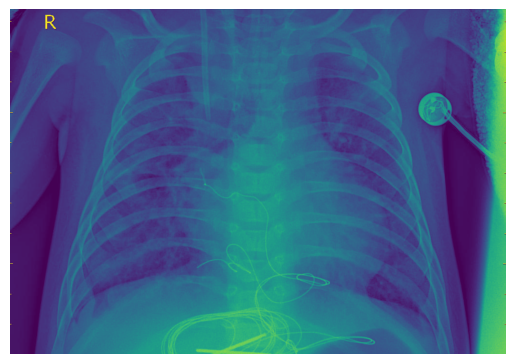

(1016, 1424)


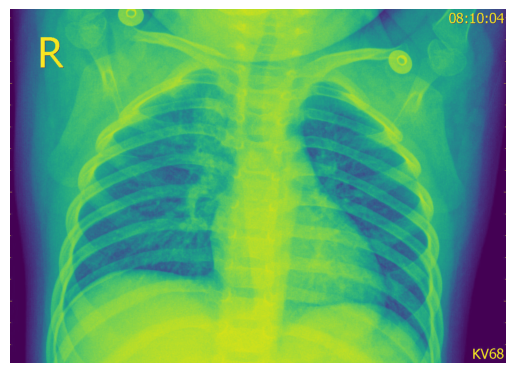

(1208, 1376)


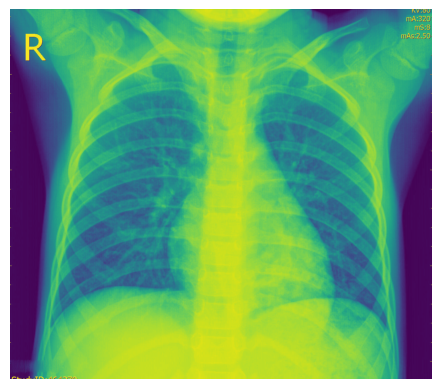

(1256, 1336)


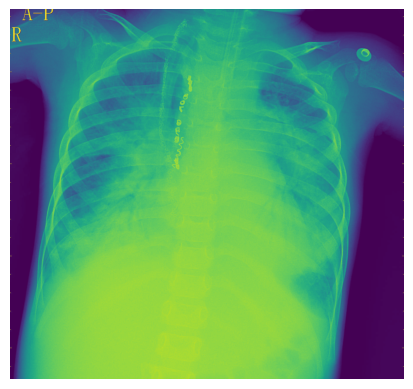

(516, 895, 3)


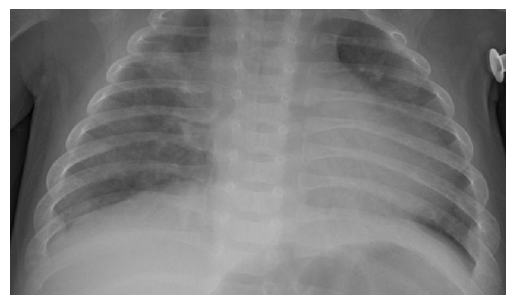

(656, 1120)


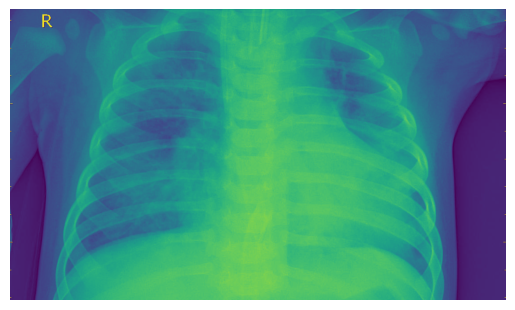

(717, 1084, 3)


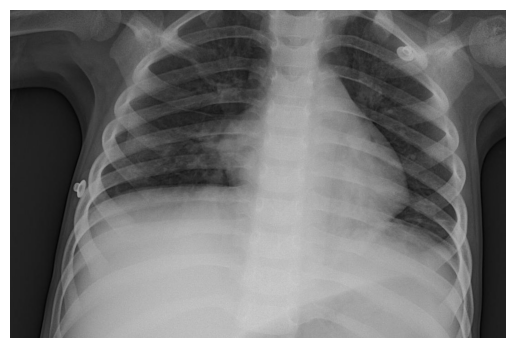

(1896, 2000)


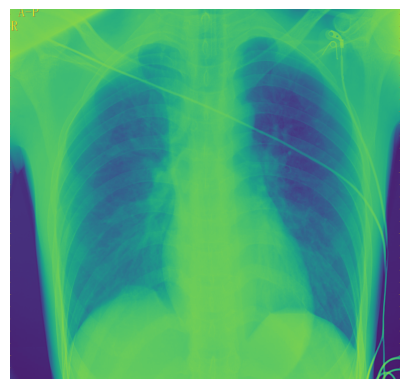

(568, 856)


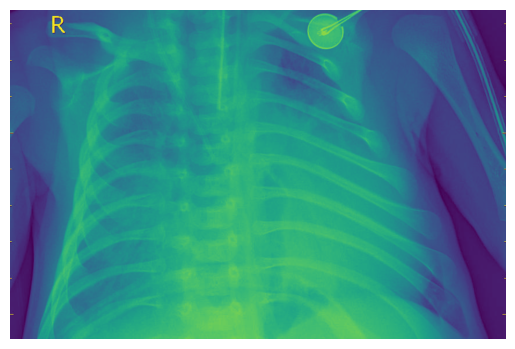

(488, 840)


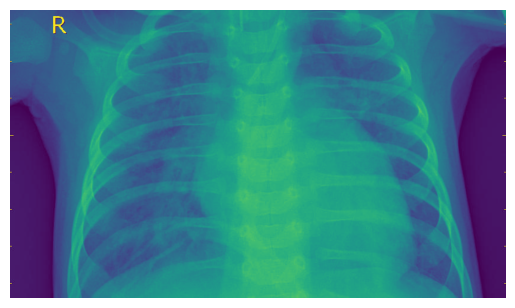

(832, 1144)


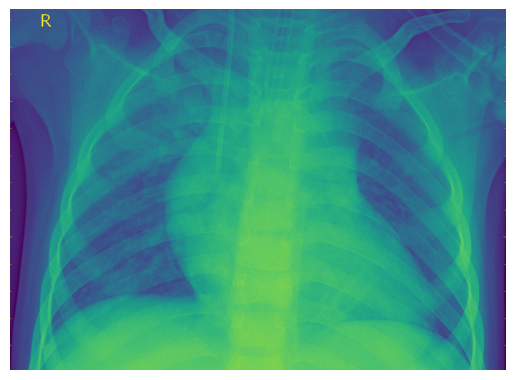

(648, 1072)


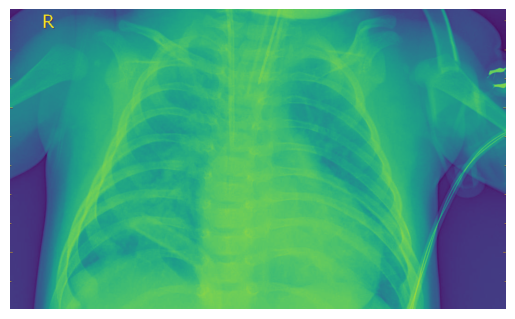

(768, 1120)


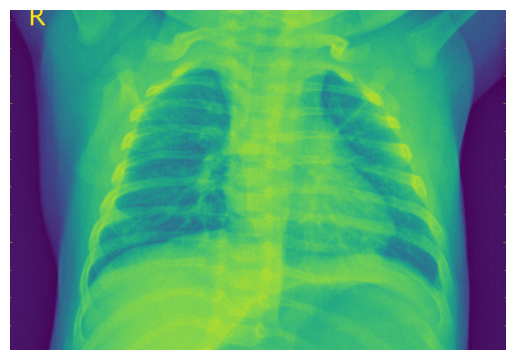

(1152, 1408)


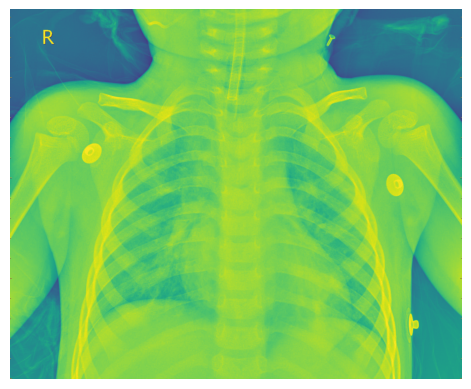

(1044, 1381)


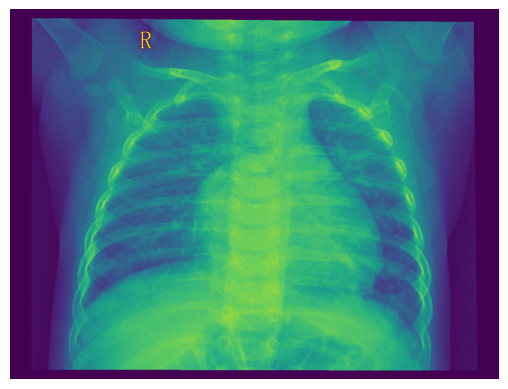

In [5]:
for num in range(15):
  img=mpimg.imread(arr_PNEUMONIA[num])
  plt.imshow(img)
  print(img.shape)  #prints the shape or size of each of the images
  plt.axis('off')
  plt.show()

From here we can see that some of the images for the PNEUMONIA Class training data set are in B&W, which may hinder our model traing process later on( in regards to # of channels). Lets check if this is true even for the NORMAL class training data set.

(1128, 1336)


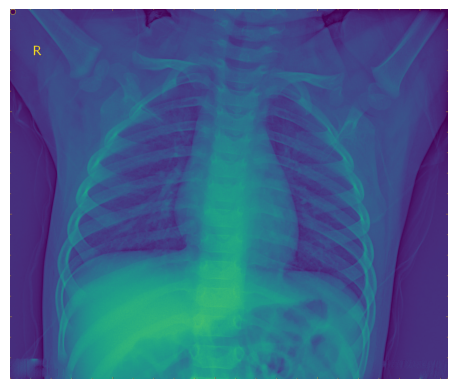

(1260, 1400)


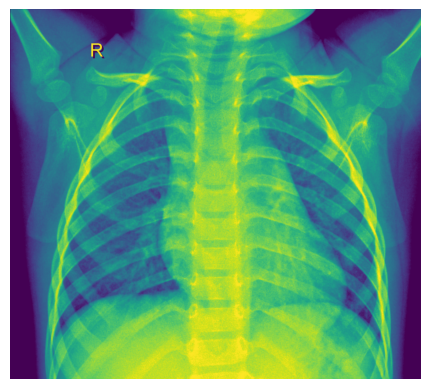

(1032, 1218)


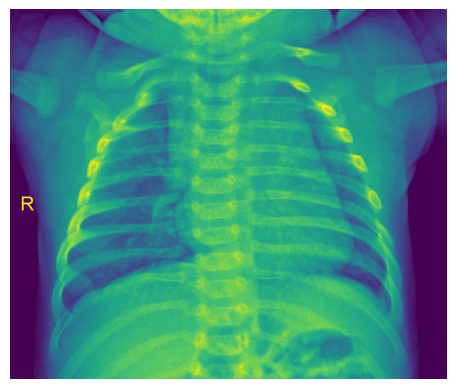

(1433, 1782)


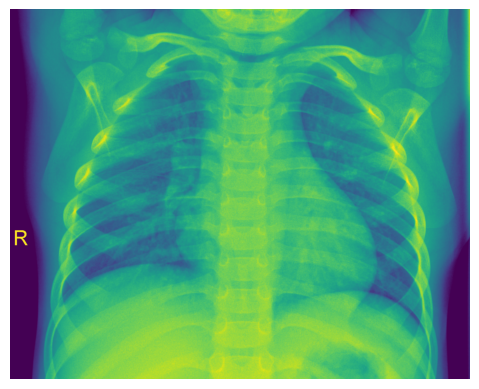

(1129, 1574)


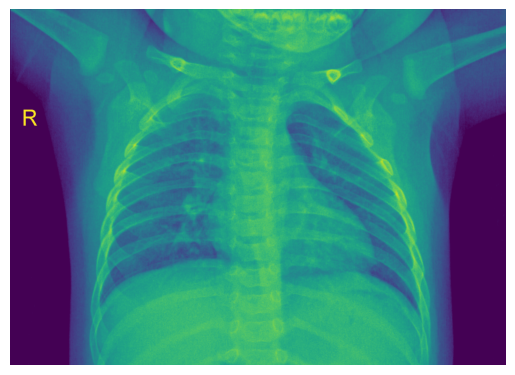

(1345, 1744)


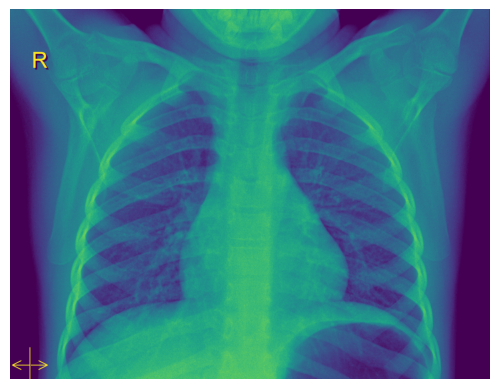

(1272, 1844)


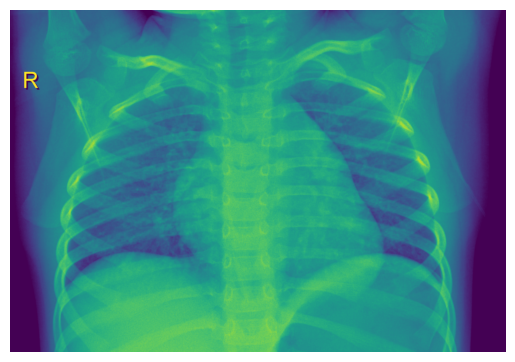

(1249, 1500)


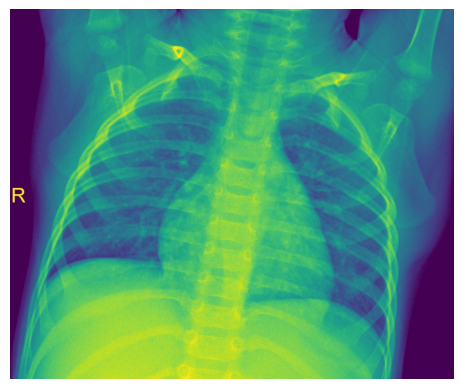

(2121, 2400)


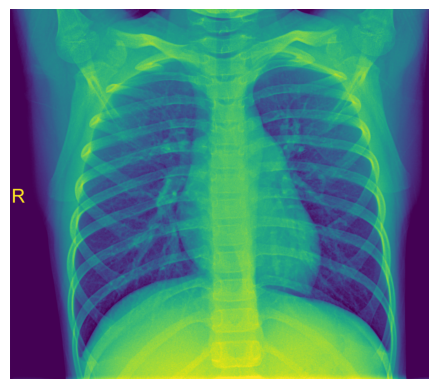

(1102, 1338)


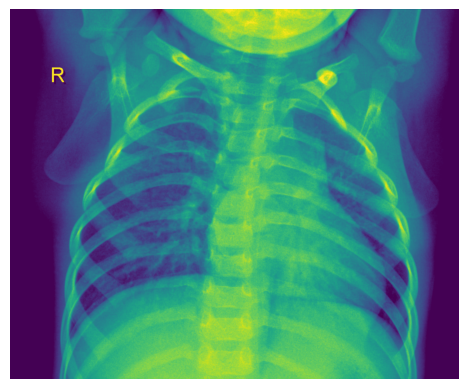

(904, 1160)


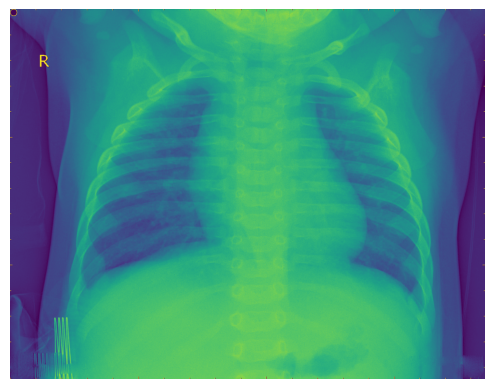

(1510, 1804)


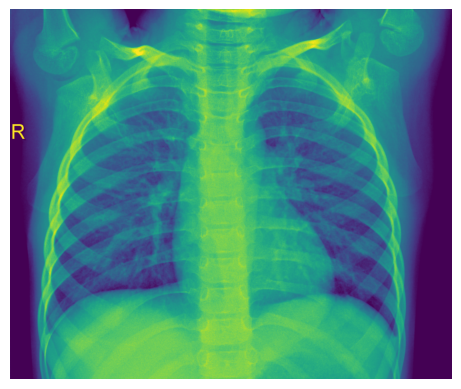

(1017, 1488)


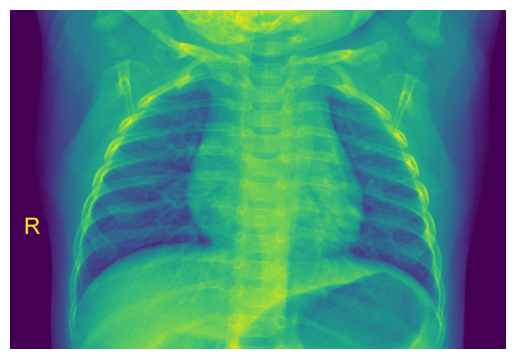

(1329, 1636)


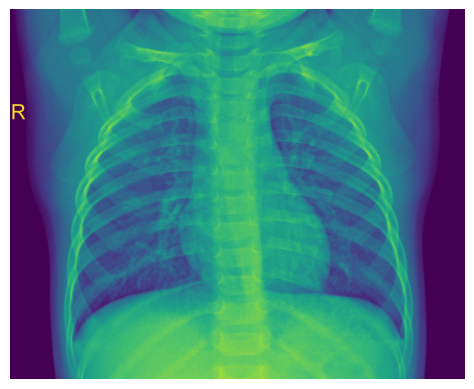

(1422, 1802)


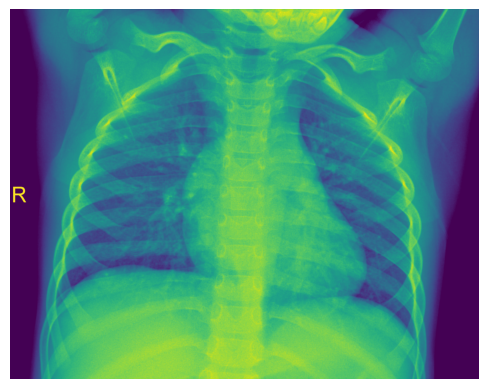

(1908, 1932)


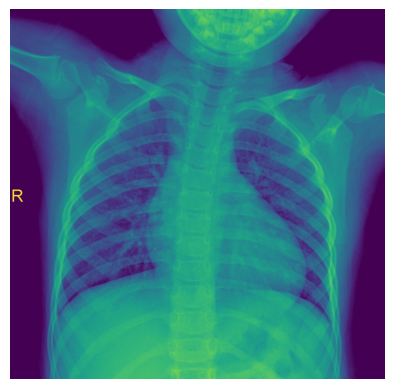

(1410, 1580)


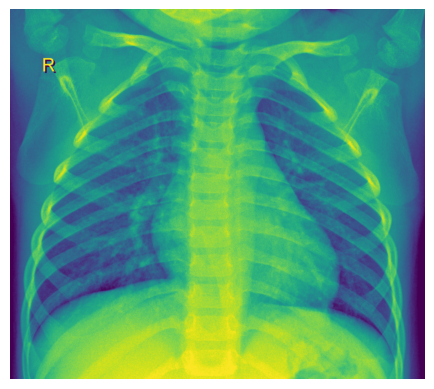

(1272, 1576)


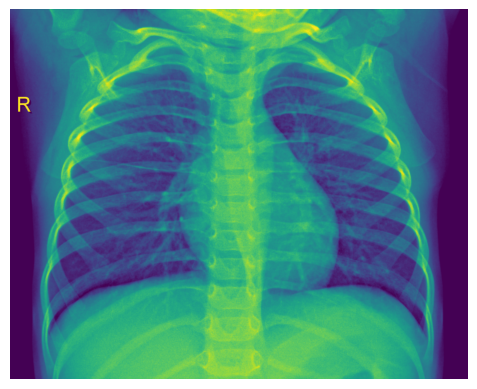

(1461, 1542)


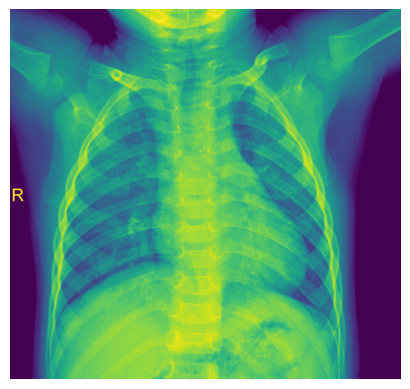

(978, 1472)


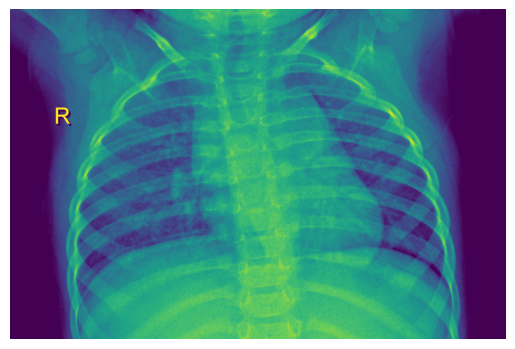

(1391, 1676)


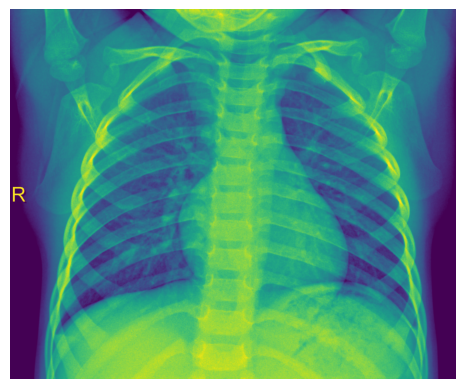

(1105, 1402)


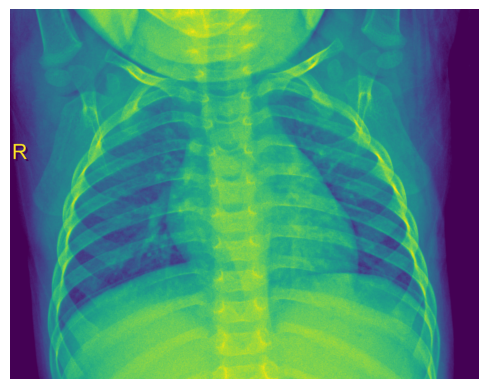

(1383, 1690)


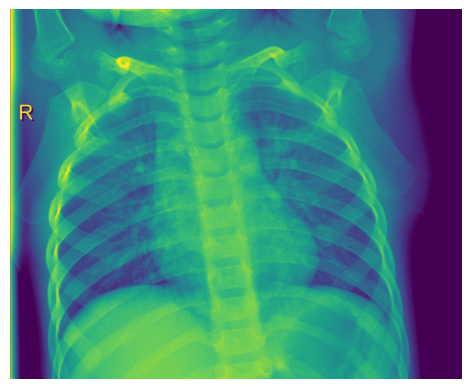

(1221, 1692)


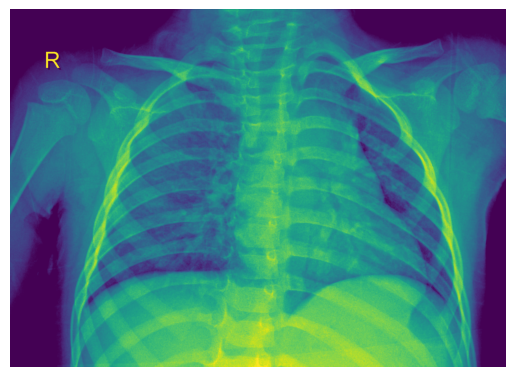

(1959, 2358)


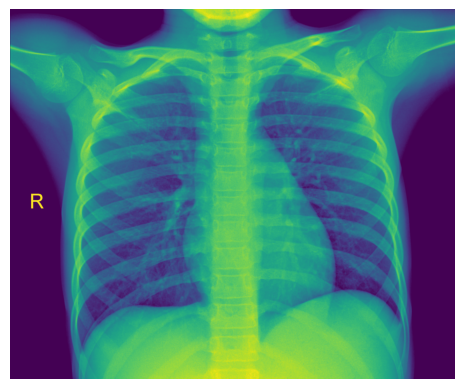

In [6]:
for num in range(25):
  img=mpimg.imread(arr_NORMAL[num])
  plt.imshow(img)
  print(img.shape)  #prints the shape or size of each of the images
  plt.axis('off')
  plt.show()

From the first 25 training set fo the NORMAL class, we can see that the training set appears to not have any B&W images. So now, to keep our data set consistent, we could try to convert the BW images in the PNEUMONIA data set into color images. This can be done using the opencv library.

In [9]:
import cv2 as cv    #importing CV2 package

IMAGE NUMBER: 0
ORIGINAL IMAGE: 
(712, 1024)
Current number of channels in this image: 2
Image already has 3 channels or is not grayscale (no conversion needed).


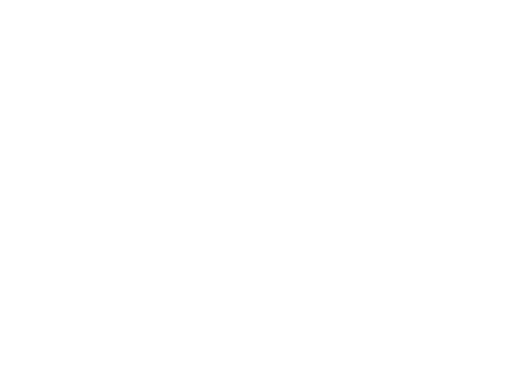

IMAGE NUMBER: 1
ORIGINAL IMAGE: 
(1016, 1424)
Current number of channels in this image: 2
Image already has 3 channels or is not grayscale (no conversion needed).


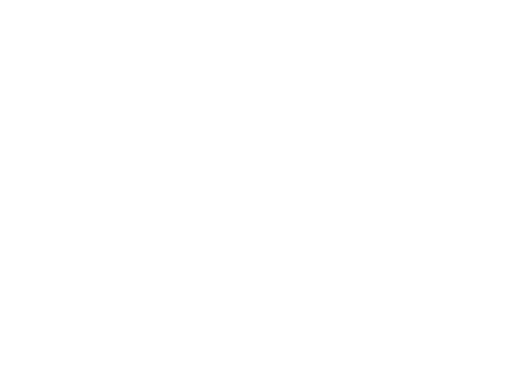

IMAGE NUMBER: 2
ORIGINAL IMAGE: 
(1208, 1376)
Current number of channels in this image: 2
Image already has 3 channels or is not grayscale (no conversion needed).


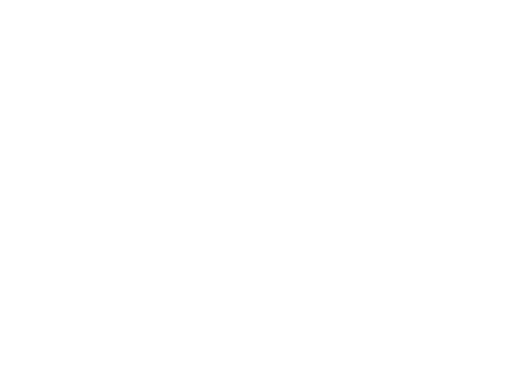

IMAGE NUMBER: 3
ORIGINAL IMAGE: 
(1256, 1336)
Current number of channels in this image: 2
Image already has 3 channels or is not grayscale (no conversion needed).


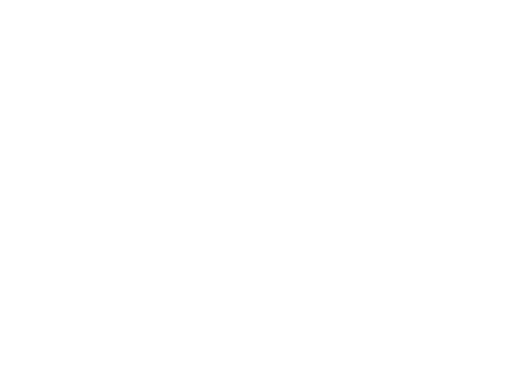

IMAGE NUMBER: 4
ORIGINAL IMAGE: 
(516, 895, 3)
Current number of channels in this image: 3
NEW IMAGE (converted from grayscale to RGB): 
(516, 895, 3)
NEW number of channels in this image: 3


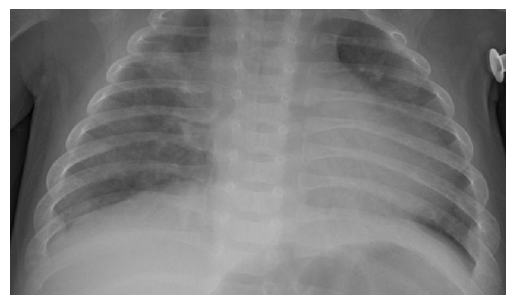

IMAGE NUMBER: 5
ORIGINAL IMAGE: 
(656, 1120)
Current number of channels in this image: 2
Image already has 3 channels or is not grayscale (no conversion needed).


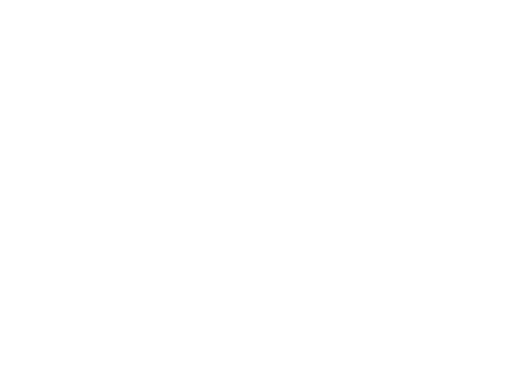

IMAGE NUMBER: 6
ORIGINAL IMAGE: 
(717, 1084, 3)
Current number of channels in this image: 3
NEW IMAGE (converted from grayscale to RGB): 
(717, 1084, 3)
NEW number of channels in this image: 3


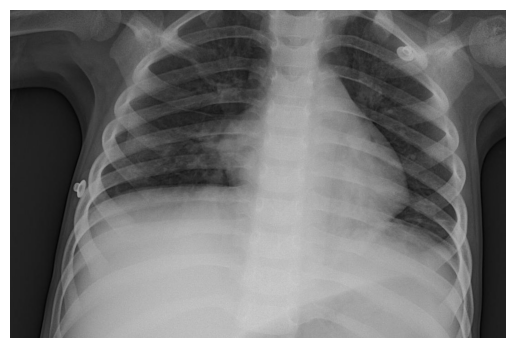

IMAGE NUMBER: 7
ORIGINAL IMAGE: 
(1896, 2000)
Current number of channels in this image: 2
Image already has 3 channels or is not grayscale (no conversion needed).


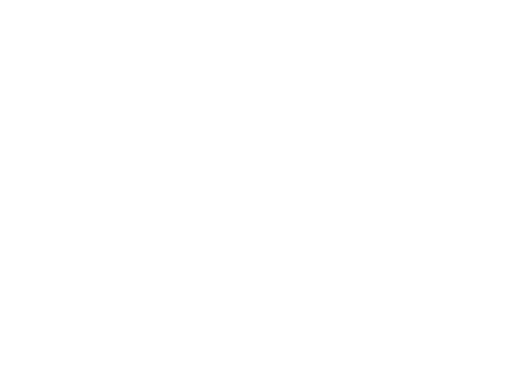

IMAGE NUMBER: 8
ORIGINAL IMAGE: 
(568, 856)
Current number of channels in this image: 2
Image already has 3 channels or is not grayscale (no conversion needed).


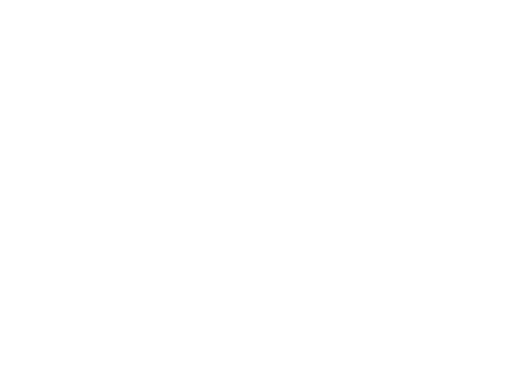

IMAGE NUMBER: 9
ORIGINAL IMAGE: 
(488, 840)
Current number of channels in this image: 2
Image already has 3 channels or is not grayscale (no conversion needed).


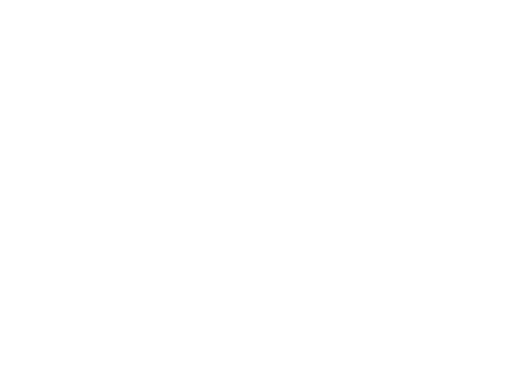

IMAGE NUMBER: 10
ORIGINAL IMAGE: 
(832, 1144)
Current number of channels in this image: 2
Image already has 3 channels or is not grayscale (no conversion needed).


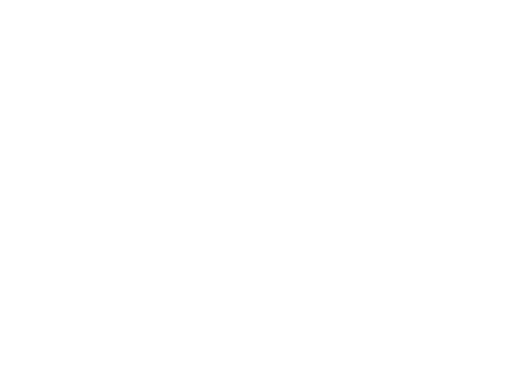

IMAGE NUMBER: 11
ORIGINAL IMAGE: 
(648, 1072)
Current number of channels in this image: 2
Image already has 3 channels or is not grayscale (no conversion needed).


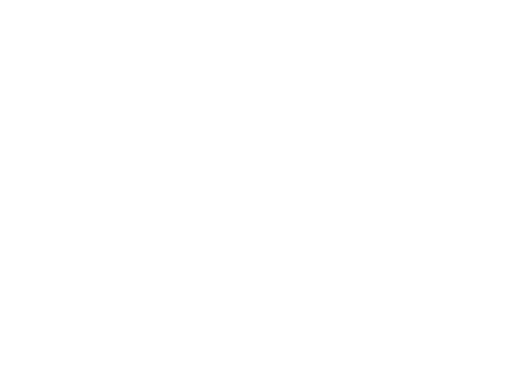

IMAGE NUMBER: 12
ORIGINAL IMAGE: 
(768, 1120)
Current number of channels in this image: 2
Image already has 3 channels or is not grayscale (no conversion needed).


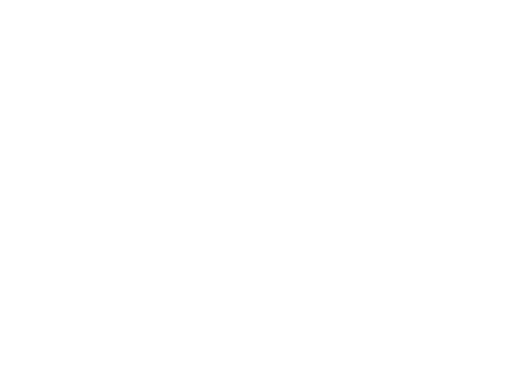

IMAGE NUMBER: 13
ORIGINAL IMAGE: 
(1152, 1408)
Current number of channels in this image: 2
Image already has 3 channels or is not grayscale (no conversion needed).


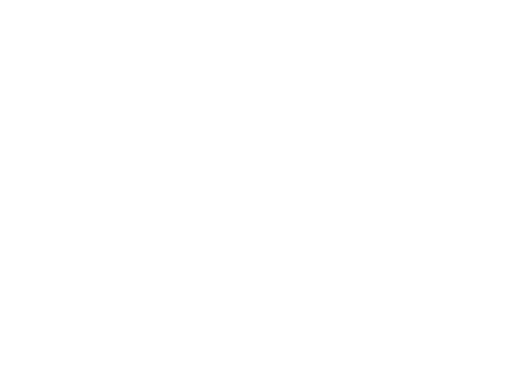

IMAGE NUMBER: 14
ORIGINAL IMAGE: 
(1044, 1381)
Current number of channels in this image: 2
Image already has 3 channels or is not grayscale (no conversion needed).


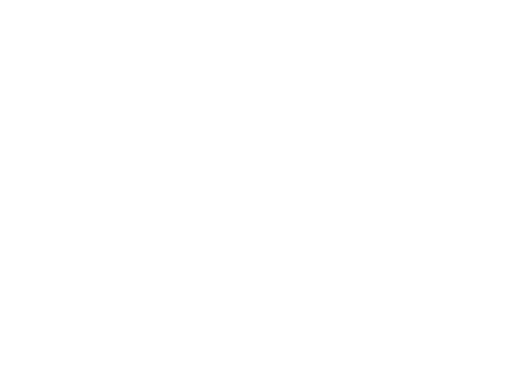

In [10]:
for num in range(15):
  img=mpimg.imread(arr_PNEUMONIA[num])
  print("IMAGE NUMBER: "+ str(num))
  print ("ORIGINAL IMAGE: " )
  #plt.imshow(img)
  print(img.shape)  #prints the shape or size of each of the images
  print("Current number of channels in this image: " + str(len(img.shape)))
  if len(img.shape) == 3:  # If it's a 2-channel (grayscale) image
    rgb_img = cv.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert grayscale to 3-channel RGB
    print("NEW IMAGE (converted from grayscale to RGB): ")
    plt.imshow(rgb_img)
    print(rgb_img.shape)  #prints the shape or size of each of the images
    print("NEW number of channels in this image: " + str(len(img.shape)))
  else:
    print("Image already has 3 channels or is not grayscale (no conversion needed).")
  plt.axis('off')
  plt.show()

Now lets try to check the class sizes to see if there is more data in one class over another
If there is more in one over another, then there would a more likely bias in training itself
To solve this, we could augment the currnet data to fill out the class with lesser data.

In [11]:
n_image_number=len(arr_PNEUMONIA)  #Provides me the  number of PNEUMONIA images in the Training Folder
p_image_number=len(arr_NORMAL)  #Provides me the  number of NORMAL images in the Training Folder

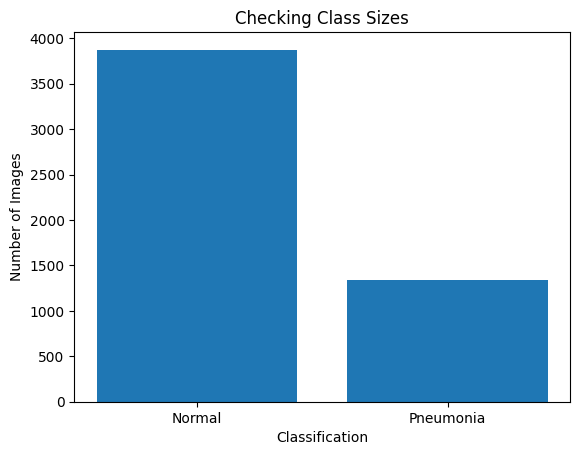

In [12]:
Classification = ['Normal', 'Pneumonia']
Number_of_Images = [n_image_number, p_image_number]
plt.bar(Classification, Number_of_Images)
plt.title('Checking Class Sizes')
plt.xlabel('Classification')
plt.ylabel('Number of Images')
plt.show()

From this result, we can clearly see that there is way more NORMAL image sizes compared than Pneumonia, therefore during training process for the model, there could be a bias in the model itself.
We could solve thsi by augmenting the number of images in the normal class.

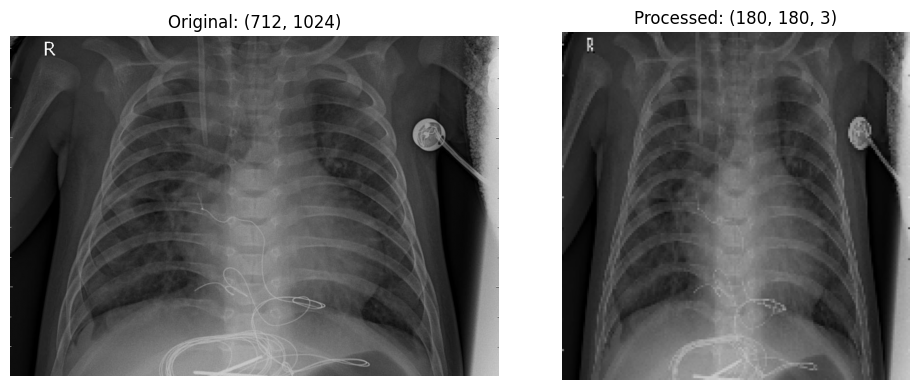

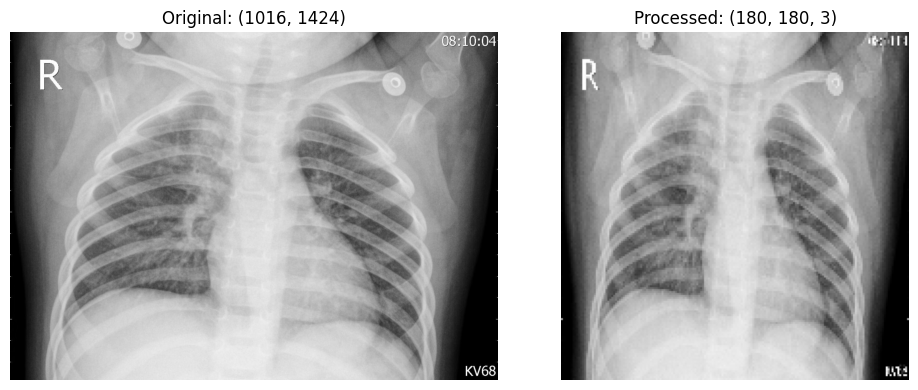

In [13]:
IMG_SIZE = 180

# Resize and rescale images to normalized [0,1] range
resize_and_rescale = tf.keras.Sequential([
    layers.Resizing(IMG_SIZE, IMG_SIZE),
    layers.Rescaling(1./255)
])

for num in range(2):
    img = mpimg.imread(arr_PNEUMONIA[num])

    # Show original image
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray' if len(img.shape) == 2 else None)
    plt.title(f'Original: {img.shape}')
    plt.axis('off')

    # Convert to 3 channels if grayscale using cv2, then to tensor for Keras layers
    processed_img = img
    if len(img.shape) == 2:  # If it's a 2-channel (grayscale) image
        processed_img = cv.cvtColor(img, cv.COLOR_GRAY2RGB)  # Convert grayscale to 3-channel RGB
        processed_img = tf.convert_to_tensor(processed_img, dtype=tf.float32) # Convert numpy array to tensor
    else:
        processed_img = tf.convert_to_tensor(processed_img, dtype=tf.float32) # Convert to tensor for Keras layers

    # Apply resize and rescale
    processed_img = resize_and_rescale(processed_img)

    # Show processed image
    plt.subplot(1, 2, 2)
    # Adjust cmap based on the number of channels for display
    display_img = processed_img.numpy() if hasattr(processed_img, 'numpy') else processed_img
    plt.imshow(display_img, cmap='gray' if display_img.shape[-1] == 1 else None)
    plt.title(f'Processed: {processed_img.shape}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

Create our CNN Model, along with our updated dataset, by directly implementing the data augmentation technique into the model, before using the convolution layers and model processing.

In [24]:
data_dir = '/kaggle/input/chest-xray-pneumonia/chest_xray/'
train_dir = f'{data_dir}train'   #access my training images
val_dir = f'{data_dir}val'        #access my validation images
test_dir = f'{data_dir}test'     #access my testing images

IMG_SIZE = 180
BATCH_SIZE = 32

print(f"Base data directory: {data_dir}")
print(f"Training data directory: {train_dir}")
print(f"Validation data directory: {val_dir}")
print(f"Test data directory: {test_dir}")
print(f"Image size for preprocessing: {IMG_SIZE}")
print(f"Batch size for training: {BATCH_SIZE}")

Base data directory: /kaggle/input/chest-xray-pneumonia/chest_xray/
Training data directory: /kaggle/input/chest-xray-pneumonia/chest_xray/train
Validation data directory: /kaggle/input/chest-xray-pneumonia/chest_xray/val
Test data directory: /kaggle/input/chest-xray-pneumonia/chest_xray/test
Image size for preprocessing: 180
Batch size for training: 32


Now our directories for our alreayd split data has be set and kept ready for resizing and processing in our model.

Now using tensorlfow, I have split the images and shuffled teh trainnig data to creat ea better model. The code and documentation used for this is here: https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image_dataset_from_directory

After that, I have used resizing and rescaling to each of the three data sets so that we can augment our data sets. This documentaion can be found here
:https://www.tensorflow.org/tutorials/images/data_augmentation

I was also able to fix the RGB problem by forcing all the image sot be loaded as RGB images using teh keras documentation again, so I can avoid using or creating my own function to chnage the picture from Black and White to color: https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image_dataset_from_directory

In [31]:
import tensorflow as tf
from tensorflow.keras import layers

resize_and_rescale = tf.keras.Sequential([
    layers.Resizing(IMG_SIZE, IMG_SIZE),
    layers.Rescaling(1./255)
])

# Load the training dataset
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    labels='inferred',
    label_mode='binary',
    color_mode='rgb', #  images are loaded as RGB
    image_size=(IMG_SIZE, IMG_SIZE),
    interpolation='nearest',
    batch_size=BATCH_SIZE,
    shuffle=True # Shuffle training data for better random data for model to learn
)

# Load the validation dataset
val_ds = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    labels='inferred',
    label_mode='binary',
    color_mode='rgb', #  images are loaded as RGB
    image_size=(IMG_SIZE, IMG_SIZE),
    interpolation='nearest',
    batch_size=BATCH_SIZE,
    shuffle=False
)

# Load the test dataset
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    labels='inferred',
    label_mode='binary',
    color_mode='rgb', #   are loaded as RGB
    image_size=(IMG_SIZE, IMG_SIZE),
    interpolation='nearest',
    batch_size=BATCH_SIZE,
    shuffle=False
)

# Apply the resize_and_rescale layer to each dataset
train_ds = train_ds.map(lambda x, y: (resize_and_rescale(x), y), num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.map(lambda x, y: (resize_and_rescale(x), y), num_parallel_calls=tf.data.AUTOTUNE)
test_ds = test_ds.map(lambda x, y: (resize_and_rescale(x), y), num_parallel_calls=tf.data.AUTOTUNE)


print(f"Training dataset element spec: {train_ds.element_spec}")
print(f"Validation dataset element spec: {val_ds.element_spec}")
print(f"Test dataset element spec: {test_ds.element_spec}")

Found 5216 files belonging to 2 classes.
Found 16 files belonging to 2 classes.
Found 624 files belonging to 2 classes.
Datasets loaded, preprocessed, and optimized.
Training dataset element spec: (TensorSpec(shape=(None, 180, 180, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 1), dtype=tf.float32, name=None))
Validation dataset element spec: (TensorSpec(shape=(None, 180, 180, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 1), dtype=tf.float32, name=None))
Test dataset element spec: (TensorSpec(shape=(None, 180, 180, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 1), dtype=tf.float32, name=None))


In [33]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomTranslation(height_factor=0.1, width_factor=0.1),
    layers.RandomContrast(factor=0.2)
])



Data augmentation model defined.


Defining a model based on convolution layers suggested by notebook from workshop during Week 7.



In [61]:

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam # Ensure you import Adam


model = tf.keras.Sequential([
    tf.keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3)), # Define input shape explicitly
    data_augmentation, # Data augmentation layer
            # Feature extraction using small filters (learns basic edges/textures)

    layers.Conv2D(32, 3, activation='relu'),
    layers.MaxPooling2D(),
            # Learns more complex shapes and color patterns

    layers.Conv2D(64, 3, activation='relu'),
    layers.MaxPooling2D(),
            # Deepest block: learns higher-level features like lesion structure

    layers.Conv2D(128, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dense(1, activation='sigmoid'), # Final layer for binary classification
    ])


print("CNN model architecture defined.")

model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy', #SUGGESTED loss function for classifying into two classes.
    metrics=['accuracy']
)

print(model.summary()) # https://keras.io/guides/sequential_model/

CNN model architecture defined.


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_8 (Sequential)       │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_54 (Conv2D)              │ (None, 178, 178, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_54 (MaxPooling2D) │ (None, 89, 89, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_55 (Conv2D)              │ (None, 87, 87, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_55 (MaxPooling2D) │ (None, 43, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_56 (Conv2D)              │ (None, 41, 41, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_56 (MaxPooling2D) │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_18 (Flatten)            │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 256)            │    13,107,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,200,961 (50.36 MB)

 Trainable params: 13,200,961 (50.36 MB)

 Non-trainable params: 0 (0.00 B)

None


In [62]:
EPOCHS = 3

print(f"Starting model training for {EPOCHS} epochs...")

history = model.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=val_ds
)

print("Model training complete. Training history stored in 'history' variable.")

Starting model training for 3 epochs...
Epoch 1/3
163/163 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - accuracy: 0.7367 - loss: 0.6678 - val_accuracy: 0.6875 - val_loss: 0.6462
Epoch 2/3
163/163 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.8131 - loss: 0.4103 - val_accuracy: 0.6250 - val_loss: 1.0423
Epoch 3/3
163/163 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - accuracy: 0.8526 - loss: 0.3465 - val_accuracy: 0.6250 - val_loss: 0.7880
Model training complete. Training history stored in 'history' variable.


For accuracy and plots, most of the documentation has been taken from the "Visualize the Data set" section of this tensor flow page https://www.tensorflow.org/tutorials/images/classification


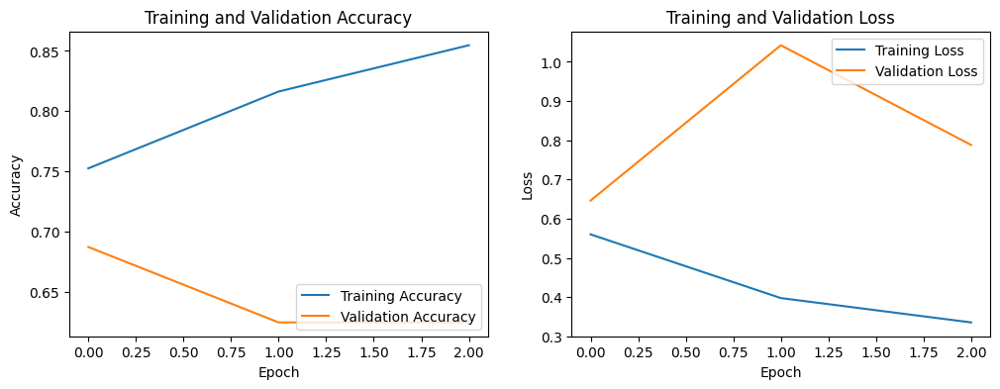

In [63]:
import matplotlib.pyplot as plt

# Extract data
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(len(acc)) # The number of epochs trained (3 in your case)

#Plot Accuracy
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.show()

From this we can see that unfortunately the model seems to be overfitted, as the training accuracy seems to be quite high, and the loss seems to keep going low meaning that our model seems to have well-learnt the training data set and does not work as well for the new data it sees.

In [64]:
# Evaluate the model
loss, accuracy = model.evaluate(test_ds)

print(f"\nModel Evaluation on Test Set:")
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

20/20 ━━━━━━━━━━━━━━━━━━━━ 4s 196ms/step - accuracy: 0.7362 - loss: 0.6258

Model Evaluation on Test Set:
Test Loss: 0.4326
Test Accuracy: 0.8221


Code for most of the confusion matrix has been taken form the sci-kit learn page   https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


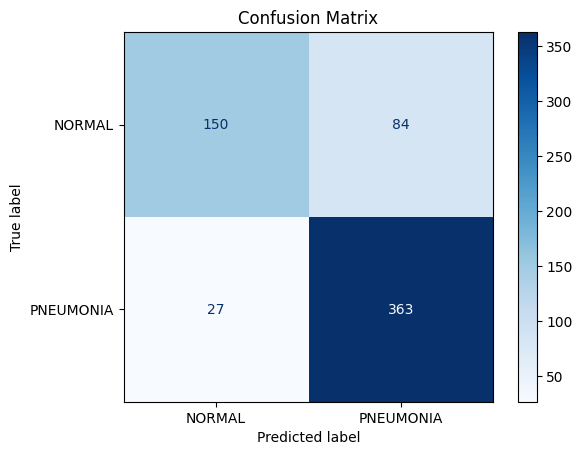


Confusion Matrix Metrics:
True Negatives (TN - Correctly predicted NORMAL): 150
False Positives (FP - Incorrectly predicted PNEUMONIA): 84
False Negatives (FN - Incorrectly predicted NORMAL): 27
True Positives (TP - Correctly predicted PNEUMONIA): 363


In [67]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# 1. Get True Labels and Predictions
# Extract true labels from the test_ds
true_labels = []
for images, labels in test_ds.unbatch():
    true_labels.append(labels.numpy())
y_true = np.concatenate(true_labels)

# Get raw predictions (probabilities)
y_pred_probs = model.predict(test_ds)

# Convert probabilities to binary class predictions (0 or 1)
# Since you used a sigmoid activation, a threshold of 0.5 is standard
y_pred = (y_pred_probs > 0.5).astype(int).flatten()

# 2. Compute the Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

# Get class names (assuming 0=NORMAL, 1=PNEUMONIA)
class_names = ['NORMAL', 'PNEUMONIA']

# 3. Plot the Confusion Matrix
disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=class_names
)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

# Print key metrics from the matrix
tn, fp, fn, tp = cm.ravel()
print(f"\nConfusion Matrix Metrics:")
print(f"True Negatives (TN - Correctly predicted NORMAL): {tn}")
print(f"False Positives (FP - Incorrectly predicted PNEUMONIA): {fp}")
print(f"False Negatives (FN - Incorrectly predicted NORMAL): {fn}")
print(f"True Positives (TP - Correctly predicted PNEUMONIA): {tp}")